# Advection Equation

Here we solve the advection equation $u_t + a u_x=0$ using as an initial condition a gaussian profile $u(x,t=0)=\exp{[-(x-x_0)^2]}$ with $x_0=5$.

We use a domain $x\in [0,10]$ with periodic boundary conditions.

In [137]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation


if "setup_text_plots" not in globals():
    from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=14, usetex=True)
%config InlineBackend.figure_format='retina'

In [170]:
#speed of the advection
a = 1.0

#domain
L = 10.0                    # length   
nx = 101                    # number of points
dx = L/(nx-1)               # spacing bw points
x = np.linspace(0, L, nx)   


cf = .5            # convergence factor
dt = cf*dx/a         # timestep
t_final = 20.0       # final time
n_i = t_final/dt

print('nx=',nx)
print('dx=',dx)
print('dt=',dt)
print('Number of iterations=', n_i)

nx= 101
dx= 0.1
dt= 0.05
Number of iterations= 400.0


## Numerical methods

In [139]:
def plot(x, u_current, name):
    ax.clear()
    ax.plot(x, u_current)
    
    ax.set_xlabel(f'$x$', c='w')
    ax.set_ylabel(f'$u(x, t)$', c='w')
    ax.set_ylim(0, 1.1)
    
    ax.set_title(f'{name} method, time = {round(t,1)}')

In [140]:
def ftcs(frame):
    global u_current, t, l2norm      # this way i can call them later also, this is what i was missing!
    
    if (t < t_final):
        u_next = u_current - a*dt/(2*dx)*(np.roll(u_current, -1) - np.roll(u_current, 1))
        u_current = u_next.copy()
        l2norm[frame] = np.sqrt(np.sum(u_current**2)/len(u_current))
        all_u[frame] = u_current
        
        plot(x, u_current, 'FTCS')
        t += dt

In [141]:
def laxf(frame):
    global u_current, t, l2norm, all_u
    
    if (t < t_final):
        u_next = 0.5*(np.roll(u_current, 1) + np.roll(u_current, -1)) - a*dt/(2*dx)*(np.roll(u_current, -1) - np.roll(u_current, 1))     
        u_current = u_next.copy()
        l2norm[frame] = np.sqrt(np.sum(u_current**2)/len(u_current))
        all_u[frame] = u_current
        
        plot(x, u_current, 'Lax-Friedrichs')
        t += dt

In [142]:
def leapfrog(frame):
    global u_current, u_previous, t, l2norm, all_u
    
    if (t < t_final):
        # roll -1 is j+1
        u_next =  u_previous - a*dt/(dx)*(np.roll(u_current, -1) - np.roll(u_current, 1))     
        u_previous = u_current.copy()
        u_current = u_next.copy()
        l2norm[frame] = np.sqrt(np.sum(u_current**2)/len(u_current))
        all_u[frame] = u_current
        
        plot(x, u_current, 'Leapfrog')
        t += dt

In [143]:
def laxw(frame):
    global u_current, t, l2norm, all_u
    
    if (t < t_final):
        u_next = u_current - a*dt/(2*dx)*(np.roll(u_current, -1) - np.roll(u_current, 1)) + 0.5*(a*dt/dx)**2*(np.roll(u_current, -1) - 2*u_current + np.roll(u_current, 1))   
        u_current = u_next.copy()
        l2norm[frame] = np.sqrt(np.sum(u_current**2)/len(u_current))
        all_u[frame] = u_current
        
        plot(x, u_current, 'Lax-Wendroff')
        t += dt

## Plots

In [177]:
# Define the initial condition 
x0 = 5
u_initial = np.exp(-(x-x0)**2)      #gaussian centered in 5

# Initialize the solution array
u_current = u_initial.copy()
u_previous = np.exp(-((x + a*dt) -x0)**2) 

#initialize the norm array
l2norm = np.zeros(round(n_i))
all_u = np.zeros((round(n_i),len(x)))

  0%|          | 0/400 [00:00<?, ?it/s]

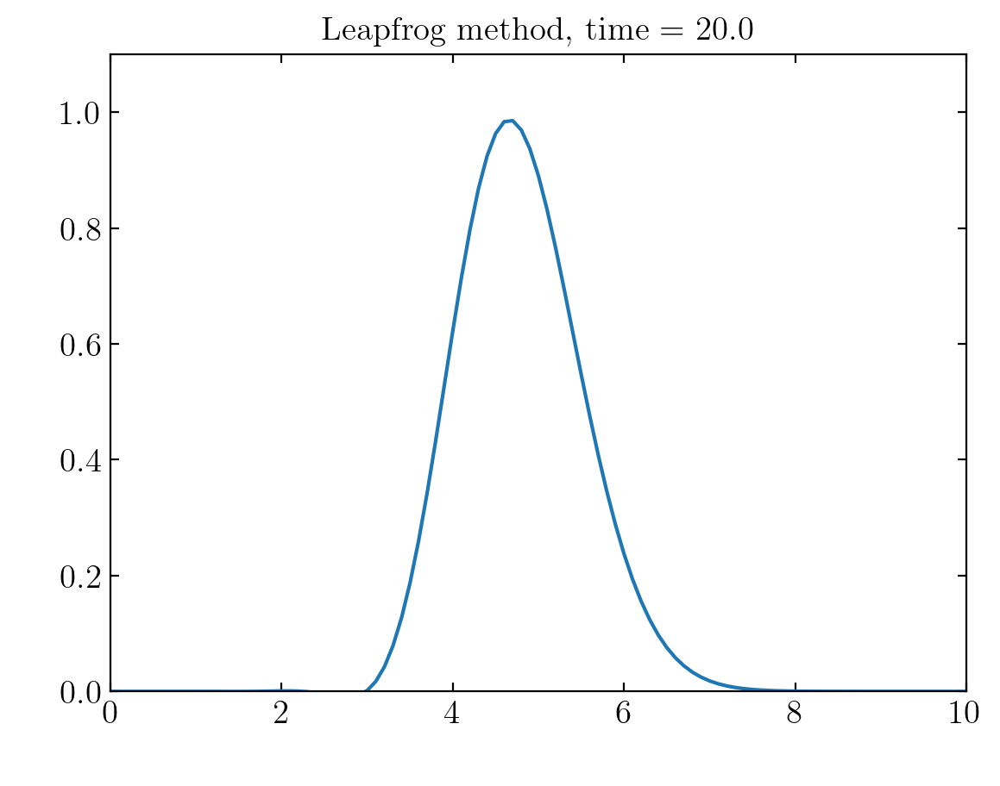

In [178]:
from tqdm.notebook import tqdm
from IPython.display import HTML

# SELECT METHOD #
h = ['FTCS', 'Lax-Friedrichs', 'Leapfrog', 'Lax-Wendroff']
t = 0.0
I = 2

num_frames = int(t_final/dt) # We set the total number of iterations as the total number of frames

fig, ax = plt.subplots()
#ftcs_ani = animation.FuncAnimation(fig, ftcs, frames = tqdm(range(num_frames)), interval=1, repeat=True)
#laxf_ani = animation.FuncAnimation(fig, laxf, frames = tqdm(range(num_frames)), interval=1, repeat=True)
leapfrog_ani = animation.FuncAnimation(fig, leapfrog, frames = tqdm(range(num_frames)), interval=1, repeat=True)
#laxw_ani = animation.FuncAnimation(fig, laxw, frames=tqdm(range(num_frames)), interval=1, repeat=True)

## Plotting the Animation
HTML(leapfrog_ani.to_jshtml())

In [179]:
# Saving the Animation
#ftcs_ani.save(r"ftcs.gif", writer=writergif)
#laxf_ani.save(r"laxf.gif", writer=writergif)
#leapfrog_ani.save(r"leapfrog.gif", writer=writergif)
#laxw_ani.save(fr'laxw.gif', writer=writergif)

In [180]:
print(num_frames)

400


(0.0, 1.1)

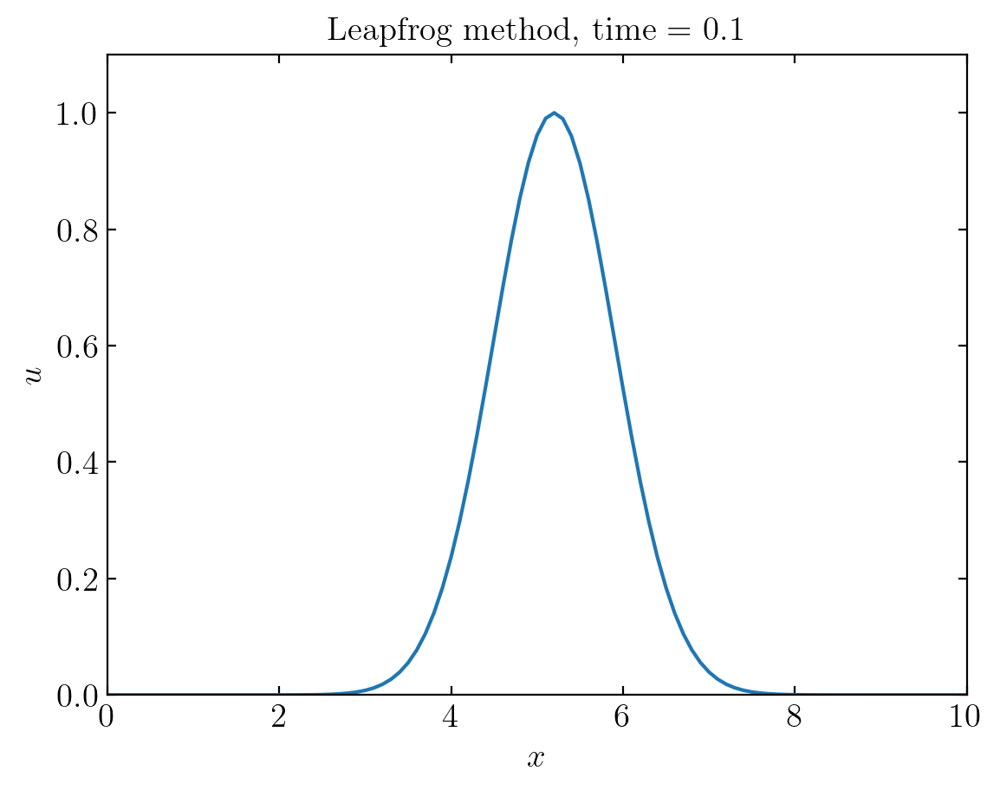

In [181]:
#you need to run the corresponding simulation first
time = np.linspace(0, t_final, num_frames)
frame = 2
t_i = round(time[frame],2)

u_i = all_u[frame]
plt.plot(x, u_i)
plt.title(f'{h[I]} method, time = {t_i}')
plt.xlabel(r'$x$')
plt.ylabel(r'$u$')
plt.ylim(0, 1.1)

#plt.savefig(f'images/{h[I]}_t={t_i}.png', dpi=150)
#plt.savefig(f'images_cf/{h[I]}_t={t_i}_cf={cf}.png', dpi=150)

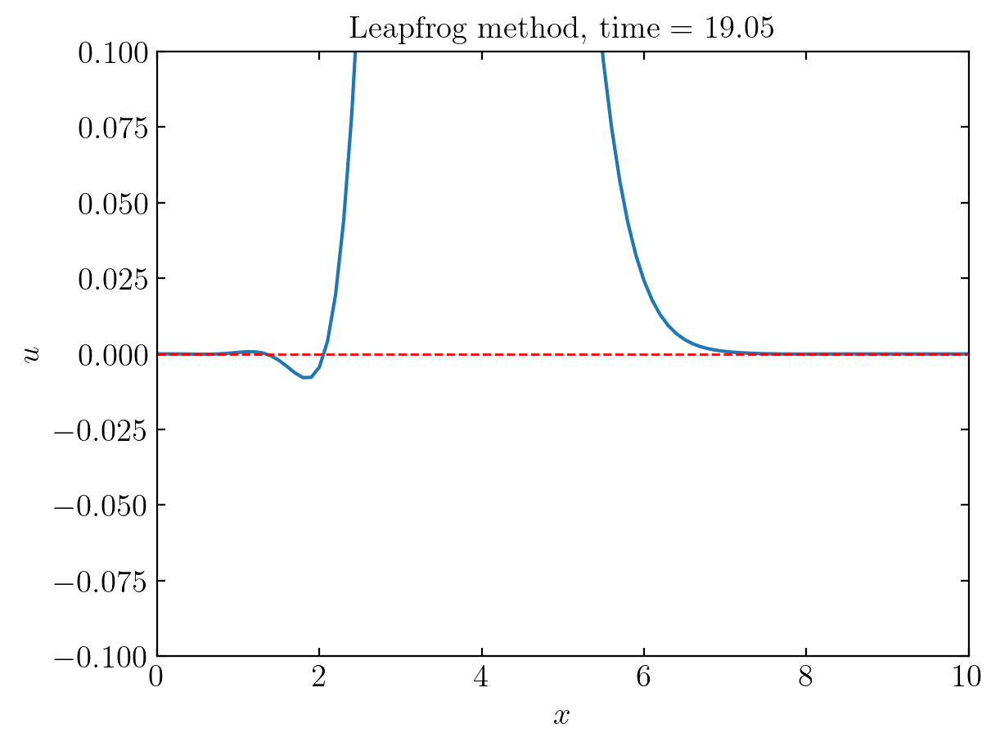

In [182]:
#you need to run the corresponding simulation first
time = np.linspace(0, t_final, num_frames)
frame = 380
t_i = round(time[frame],2)

u_i = all_u[frame]
plt.plot(x, u_i)
plt.title(f'{h[I]} method, time = {t_i}')
plt.xlabel(r'$x$')
plt.ylabel(r'$u$')
plt.axhline(0, 0,10, ls = '--', c='r', lw = 1)
plt.ylim(-.1,.1)

plt.savefig(f'results/{h[I]}_t={t_i}_cf={cf}.png', dpi=150)

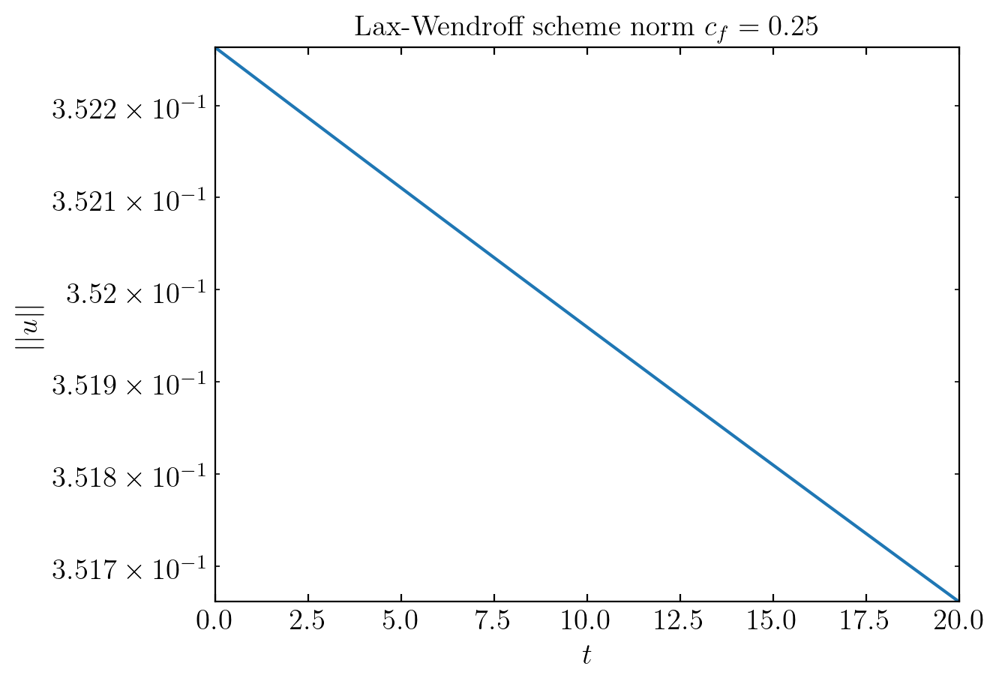

In [153]:
#Compare with data stored
#l2_saved = np.genfromtxt('./l2norm_FTCS.dat', comments='#')
#l2_saved = np.genfromtxt('./l2norm_LAX.dat', comments='#')
#l2_saved = np.genfromtxt('./l2norm_LEAPFROG.dat', comments='#')
#l2_saved = np.genfromtxt('./l2norm_LAXWENDROFF.dat', comments='#')

plt.plot(time, l2norm)
plt.yscale('log')
#plt.plot(l2_saved[:,0], l2_saved[:,1], '+')
plt.yscale('log')

plt.title(fr'{h[I]} scheme norm $c_f = {cf}$')

plt.xlabel(r'$t$')
plt.ylabel(r'$||u||$')

#plt.savefig(f"results/l2norm_FTCS_cf{cf}" + ".png", dpi=150, bbox_inches='tight')
#plt.savefig(f"results/l2norm_LAX_cf{cf}" + ".png", dpi=150, bbox_inches='tight')
#plt.savefig(f"results/l2norm_LEAPFROG_cf{cf}" + ".png", dpi=150, bbox_inches='tight')
plt.savefig(f"results/l2norm_LAXWENDROFF_cf{cf}" + ".png", dpi=150, bbox_inches='tight')
plt.show()

# Burger's Equation
Here we solve the advection equation $u_t + u\ u_x=0$ using as an initial condition a gaussian profile $u(x,t=0)=\exp{[-(x-x_0)^2]}$ with $x_0=5$.

We use a domain $x\in [0,10]$ with periodic boundary conditions.

In [ ]:
#speed of the advection
a = 1.0

#domain
L = 10.0                    # length   
nx = 101                    # number of points
dx = L/(nx-1)               # spacing bw points
x = np.linspace(0, L, nx)   


cf = 0.5             # convergence factor
dt = cf*dx/a         # timestep
t_final = 20.0       # final time
n_i = t_final/dt

print('nx=',nx)
print('dx=',dx)
print('dt=',dt)
print('Number of iterations=', n_i)

In [ ]:
def non_conservative(frame):
    global u_current, u_previous, t, l2norm
    
    #upwind method in non conservative form
    if (t <= t_final):
        # roll -1 is j+1
        u_next =  u_current - u_current*dt/(dx)*(u_current - np.roll(u_current, 1))     
        u_previous = u_current.copy()
        u_current = u_next.copy()
        l2norm[frame] = np.sqrt(np.sum(u_current**2)/len(u_current))
        
        sol.set_data(x, u_current)
        t += dt
    
    return sol

In [ ]:
def conservative(frame):
    global u_current, u_previous, t, l2norm
    
    #upwind method in conservative form
    if (t <= t_final):
        # roll -1 is j+1
        u_next =  u_current - dt/(dx)*(0.5*u_current**2 - 0.5*np.roll(u_current, 1)**2)     
        u_previous = u_current.copy()
        u_current = u_next.copy()
        l2norm[frame] = np.sqrt(np.sum(u_current**2)/len(u_current))
        
        sol.set_data(x, u_current)
        t += dt
    
    return sol

## Plots

In [ ]:
# Define the initial condition 
x0 = 5
u_initial = np.exp(-(x-x0)**2)      #gaussian centered in 5

# Initialize the solution array
u_current = u_initial.copy()
u_previous = np.exp(-((x + a*dt) -x0)**2) 

#initialize the norm array
l2norm = np.zeros(round(n_i))

In [ ]:
t = 0.0

fig, ax = plt.subplots()
ax.set_xlabel(f'$x$', c='w')
ax.set_ylabel(f'$u(x, t)$', c='w')
ax.set_ylim(0, 1.1)

sol, = ax.plot(x, u_current)

num_frames = int(t_final/dt) # We set the total number of iterations as the total number of frames

nc_ani = animation.FuncAnimation(fig, non_conservative, frames = num_frames, interval=1, repeat=True)###
#c_ani = animation.FuncAnimation(fig, conservative, frames = num_frames, interval=1, repeat=True)


# Saving the Animation
writergif = animation.PillowWriter(fps=30)
nc_ani.save(r"nc.gif", writer=writergif)
#c_ani.save(r"c.gif", writer=writergif)

In [ ]:
time = np.linspace(0, t_final, num_frames)

plt.plot(time, l2norm)
plt.yscale('log')

#plt.savefig("l2_norm_c" + ".png")
#plt.savefig("l2_norm_nc" + ".png")
plt.show()